# Flood Detection Using NDWI and Machine Learning with Sentinel-2

The goal of this project is to detect and classify **flooded vs. non-flooded areas** using Sentinel-2 satellite imagery and the **Normalized Difference Water Index (NDWI)**. This project uses a dual-location strategy to contrast flood-prone regions with dry, non-flooded zones. The analysis compares water-related spectral features before and after flood events, using both remote sensing and machine learning techniques.

### Project Workflow:
1. **Acquire pre- and post-event Sentinel-2 imagery** for the selected locations.
2. **Generate NDWI masks** using the Green and NIR bands to identify surface water.
3. **Perform classification** using an unsupervised method (KMeans) to group similar surface types, and optionally validate using supervised methods like **Random Forest**.
4. **Analyze spatial patterns of water extent** to compare flood-affected and non-affected regions.
5. **Evaluate the environmental cost** of running the remote sensing analysis pipeline in line with AI4EO project sustainability requirements.

### Study Areas:
- **Khulna, Bangladesh**: A low-lying deltaic region frequently impacted by seasonal flooding and river overflow, especially during monsoon periods.
- **Mandalay Region, Myanmar**: A drier inland region characterized by less annual precipitation, used in this project as a baseline for non-flooded conditions.

This comparative approach enables assessment of NDWI effectiveness and machine learning classification accuracy across distinct hydrological environments.

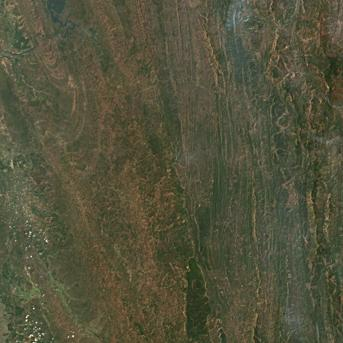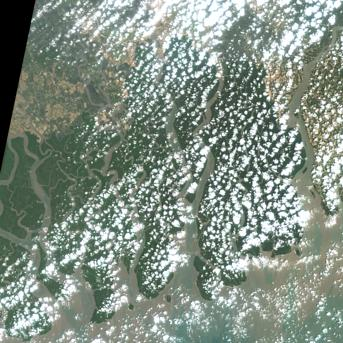

## Notebook Requirements

This notebook uses `rasterio`, a Python library for reading and processing geospatial raster data such as **Sentinel-2 imagery**. It will be used to extract the necessary bands to compute the **Normalized Difference Water Index (NDWI)**.

You will also need to mount your Google Drive to access your downloaded satellite imagery. The code expects `.jp2` image files for **Band 03 (Green)** and **Band 08 (NIR)**, which are required for NDWI calculation. Be sure to update the file paths in the notebook to match the location of your own `.SAFE` Sentinel-2 folders inside your Drive.

This version of the notebook is designed to analyze and compare **two specific geographic locations**:
- **Khulna, Bangladesh** – a coastal, flood-affected region that frequently experiences seasonal inundation
- **Mandalay Region, Myanmar** – an inland area with lower rainfall, used here as a comparative baseline for non-flooded conditions

⚠️ **Important:** Make sure that your Sentinel-2 `.SAFE` directories are extracted properly and that the paths to the `IMG_DATA` folders are accurate before running any code cells.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install rasterio

### 📁 Dataset Setup and File Paths

The following code cell imports the necessary libraries and defines the file paths for two Sentinel-2 datasets used in this project:

- **Khulna, Bangladesh (Wet/Flooded Season)** – Sentinel-2 imagery captured shortly after a heavy rainfall or monsoon event. This dataset represents the flooded condition to be analyzed using NDWI.
- **Mandalay Region, Myanmar (Dry/Control Season)** – Sentinel-2 imagery from a dry period in a typically arid region. This acts as a comparative control to highlight differences in water coverage.

These `.jp2` file paths should point to your corresponding Sentinel-2 **B03 (Green)** and **B08 (NIR)** band files stored in your Google Drive. Ensure that the paths are correctly copied from the appropriate `IMG_DATA` subfolders inside each `.SAFE` directory.

These paths will be reused throughout the notebook for band loading, NDWI calculation, and classification.  
📌 *If you're working with different tiles or acquisition dates, be sure to update the filenames and folder names accordingly to match your own dataset.*


In [ ]:
# --- Import libraries
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# --- File paths: double-check these paths are correct on your Drive
green_mandalay = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R10m/T46QDK_20250328T041611_B03_10m.jp2'
nir_mandalay   = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R10m/T46QDK_20250328T041611_B08_10m.jp2'

green_khulna = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R10m/T45QYE_20250402T043221_B03_10m.jp2'
nir_khulna  = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R10m/T45QYE_20250402T043221_B08_10m.jp2'




# 🌊 Creating a Benchmark: Normalized Difference Water Index (NDWI)

The **Normalized Difference Water Index (NDWI)** is commonly used to detect surface water features in satellite imagery. First introduced by **S.K. McFeeters (1996)**, NDWI enhances the presence of water by contrasting reflected green light and absorbed near-infrared (NIR) radiation.

The NDWI is calculated using the formula:

$$
\text{NDWI} = \frac{\text{Green} - \text{NIR}}{\text{Green} + \text{NIR}}
$$

In the context of **Sentinel-2 imagery**:
- **Band 03 (B03)** represents the **Green** spectral band
- **Band 08 (B08)** represents the **Near-Infrared (NIR)** spectral band

### Typical NDWI Interpretation:
- **NDWI > 0.5** → Strong presence of water (e.g., rivers, lakes, floodwaters)
- **NDWI 0 to 0.2** → May indicate vegetation or urban surfaces
- **NDWI < 0** → Generally dry surfaces like soil or built-up areas

Due to regional variation and surface reflectance properties, the NDWI values in this project are observed to be slightly lower. As a result, a **threshold of 0.0** is used to generate binary water masks:
- **NDWI > 0** → Classified as **Water**
- **NDWI ≤ 0** → Classified as **Non-water**

This thresholding serves as a **baseline benchmark**, which we compare against unsupervised classification results from machine learning algorithms like **K-Means**.






## NDWI Computation for Flood Detection

In this section, we compute the **Normalized Difference Water Index (NDWI)** for both study areas:
- **Khulna, Bangladesh (Flooded)**  
- **Mandalay Region, Myanmar (Dry)**  

Using **Sentinel-2 imagery**, we extract **Band 03 (Green)** and **Band 08 (Near-Infrared)** to calculate NDWI, which highlights the presence of surface water.

To manage memory efficiently in Google Colab, the imagery is optionally downsampled. NDWI is then computed for each region using the standard formula, followed by thresholding to create **binary water masks**:

- `1` → Water or flood-affected area  
- `0` → Non-water (e.g. dry land, built-up, vegetation)

These binary masks allow for clear visual comparison of **water extent differences** between flooded and dry conditions, helping identify flood impact zones.






In [ ]:
# --- Load and downsample both datasets (Khulna and Mandalay) ---

def load_band(path):
    with rasterio.open(path) as src:
        return src.read(1).astype('float32')

# Load all four bands
green1 = load_band(green_khulna)
nir1   = load_band(nir_khulna)

green2 = load_band(green_mandalay)
nir2   = load_band(nir_mandalay)

# Optional: downsample for reduced RAM usage
def downsample_array(arr, step=5):
    return arr[::step, ::step]

step = 5  # You can increase this if RAM is still tight (e.g., step = 10)
green1 = downsample_array(green1, step)
nir1   = downsample_array(nir1, step)
green2 = downsample_array(green2, step)
nir2   = downsample_array(nir2, step)

# Load profile metadata from one image (used later if exporting GeoTIFFs)
with rasterio.open(green_khulna) as src:
    profile = src.profile



In [ ]:
green1, nir1
green2, nir2


(array([[1804., 1896., 1868., ..., 2462., 2102., 2098.],
        [1763., 1910., 2162., ..., 2426., 2182., 1954.],
        [1872., 2140., 2128., ..., 2282., 1998., 1966.],
        ...,
        [1910., 1918., 1968., ..., 1763., 1746., 1708.],
        [1926., 1960., 2026., ..., 1750., 1684., 1581.],
        [1941., 1821., 2076., ..., 1711., 1680., 1674.]], dtype=float32),
 array([[3758., 3442., 3412., ..., 4213., 3855., 3792.],
        [3519., 3768., 3886., ..., 4288., 4084., 3632.],
        [3774., 3648., 3742., ..., 4271., 3909., 3786.],
        ...,
        [1594., 1624., 1948., ..., 4483., 4112., 3784.],
        [1595., 1776., 1670., ..., 4216., 3475., 3801.],
        [1697., 1827., 1715., ..., 4179., 3868., 4087.]], dtype=float32))

In [ ]:
ndwi1 = (green1 - nir1) / (green1 + nir1 + 1e-10)
ndwi2 = (green2 - nir2) / (green2 + nir2 + 1e-10)

threshold = 0.0
ndwi_mask1 = (ndwi1 > threshold).astype('uint8')
ndwi_mask2 = (ndwi2 > threshold).astype('uint8')


Plotting the mask:

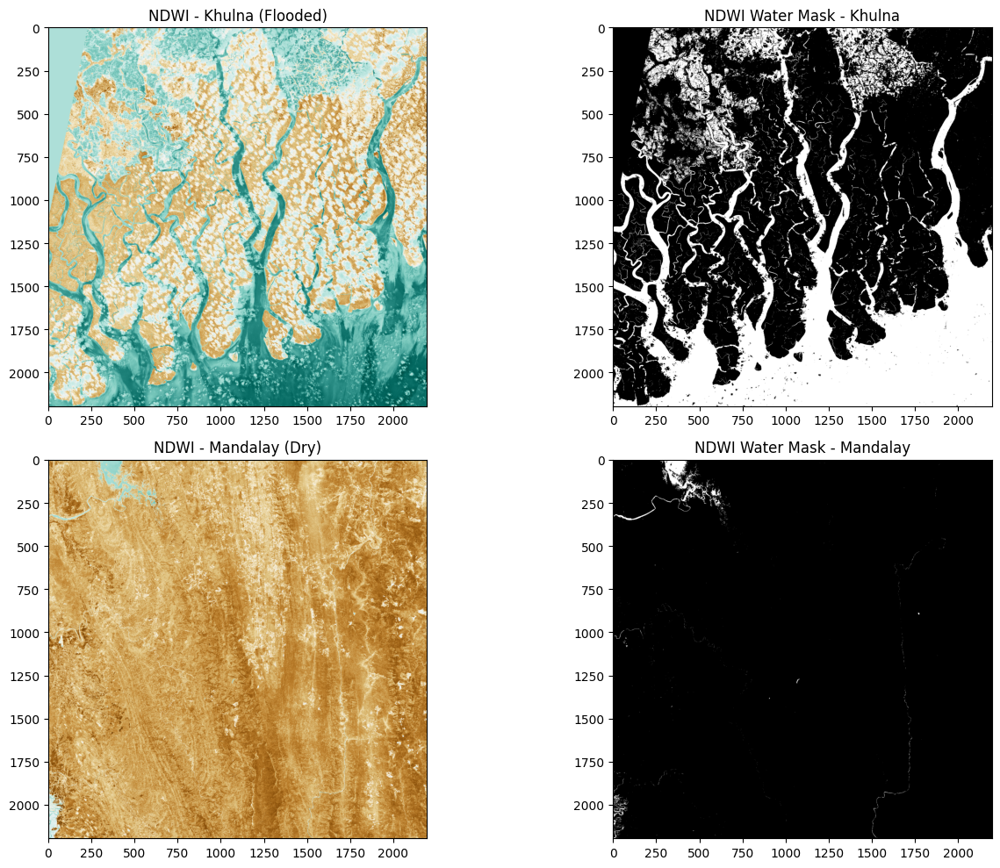

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

axs[0, 0].imshow(ndwi1, cmap='BrBG')
axs[0, 0].set_title('NDWI - Khulna (Flooded)')
axs[0, 1].imshow(ndwi_mask1, cmap='gray')
axs[0, 1].set_title('NDWI Water Mask - Khulna')

axs[1, 0].imshow(ndwi2, cmap='BrBG')
axs[1, 0].set_title('NDWI - Mandalay (Dry)')
axs[1, 1].imshow(ndwi_mask2, cmap='gray')
axs[1, 1].set_title('NDWI Water Mask - Mandalay')

plt.tight_layout()
plt.show()



# 🧪 K-means Clustering Algorithm

**K-means clustering** is a widely used unsupervised machine learning algorithm that groups pixels based on spectral similarity. It is particularly useful when the underlying structure of the data is unknown or when no labeled training data is available.

In this project, K-means clustering is applied to **Sentinel-2 imagery** from two contrasting regions:

- **Khulna, Bangladesh** – a flood-affected area captured after a significant rainfall event  
- **Mandalay Region, Myanmar** – a dry inland area used as a non-flooded baseline  

By clustering pixel values from selected band combinations (e.g., Green & NIR), we aim to identify and classify **surface water features** across both regions, enabling a comparison of water extent between flooded and dry conditions.



## 🌄 Mandalay Region

For the **Mandalay Region**, which serves as the dry-season baseline, we apply three different K-means clustering experiments to evaluate water classification in a low-precipitation environment:

- **NDWI-based clustering**: using bands **03 (Green)** and **08 (NIR)**. This index is traditionally used for water body detection.
- **SWI-based clustering**: using bands **05 (Vegetation Red Edge)** and **11 (SWIR)**. This combination was proposed by **Jiang et al. (2020)** to improve water extraction, particularly in complex or mixed land covers.
- **MNDWI-based clustering**: using bands **03 (Green)** and **11 (SWIR)**. This index enhances open water features while suppressing built-up areas and vegetation, making it especially useful in urban or semi-urban dry environments.

By running unsupervised K-means classification on each combination, we can analyze how well these indices perform in distinguishing land and water under dry seasonal conditions.



### 📊 Band Combination: NDWI (03 + 08)

In this method, we apply K-means on Sentinel-2 bands **B03 (green)** and **B08 (NIR)** to see if the unsupervised clustering approach captures flooded vs. non-flooded regions similarly to NDWI-based detection.


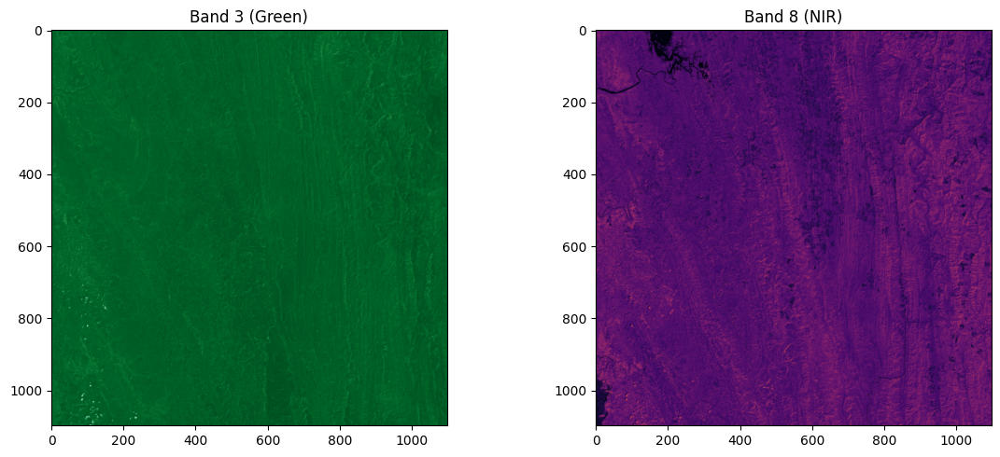

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- File paths to your B03 (Green) and B08 (NIR) bands ---
green_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R10m/T46QDK_20250328T041611_B03_10m.jp2'
nir_path   = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R10m/T46QDK_20250328T041611_B08_10m.jp2'

# --- Optional: Downsampling helper ---
def downsample(arr, step=10):
    return arr[::step, ::step]

# --- Load and downsample both bands ---
with rasterio.open(green_path) as src:
    band_green = downsample(src.read(1).astype('float32'))

with rasterio.open(nir_path) as src:
    band_nir = downsample(src.read(1).astype('float32'))

# --- Stack the downsampled bands ---
band_stack = np.dstack([band_green, band_nir])

# --- Plot the bands ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.imshow(band_stack[:, :, 0], cmap='BuGn_r')  # Green band
ax1.set_title('Band 3 (Green)')

ax2.imshow(band_stack[:, :, 1], cmap='inferno')  # NIR band
ax2.set_title('Band 8 (NIR)')

plt.tight_layout()
plt.show()



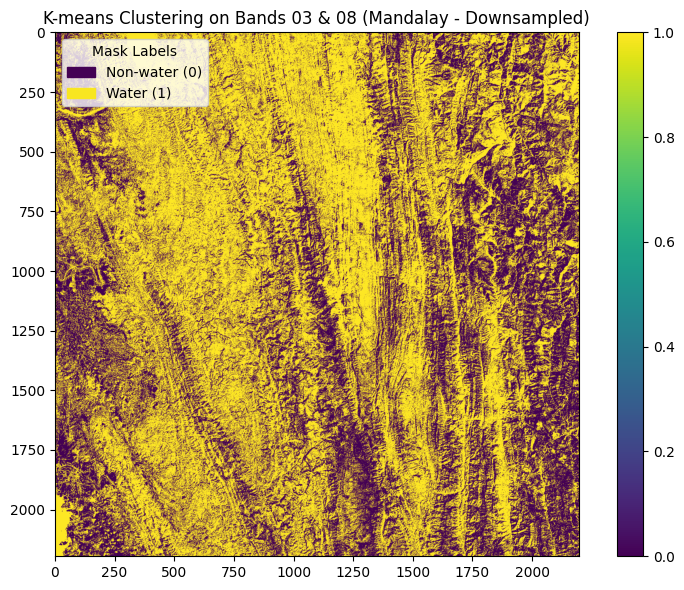

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# --- Downsampling Function ---
def load_band_downsampled(path, step=5):
    with rasterio.open(path) as src:
        band = src.read(1).astype('float32')
        return band[::step, ::step]

# --- Paths for Khulna (Flooded) ---
k03_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R10m/T46QDK_20250328T041611_B03_10m.jp2'
k08_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R10m/T46QDK_20250328T041611_B08_10m.jp2'

# --- Load and Downsample Bands ---
green = load_band_downsampled(k03_path, step=5)
nir   = load_band_downsampled(k08_path, step=5)

# --- Stack and Mask ---
stack = np.dstack([green, nir])
valid_mask = np.all(stack > 0, axis=2)
X = stack[valid_mask].reshape(-1, 2)

# --- K-means Clustering ---
kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(X)

# --- Create Output Mask Image ---
mask_image = np.full(stack.shape[:2], -1, dtype=int)
mask_image[valid_mask] = labels

# --- Plotting ---
plt.figure(figsize=(8, 6))
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99)),
]
plt.legend(patches, ['Non-water (0)', 'Water (1)'], loc='upper left', title='Mask Labels')
plt.imshow(mask_image, cmap='viridis')
plt.title('K-means Clustering on Bands 03 & 08 (Mandalay - Downsampled)')
plt.colorbar()
plt.tight_layout()
plt.show()


### 🔬 Band Combination: SWI (05 + 11)

This method applies K-means clustering on Sentinel-2 bands **B05 (vegetation red edge)** and **B11 (SWIR)**, as used in the SWI index developed by Jiang et al. These bands have shown improved performance for water detection in complex environments.


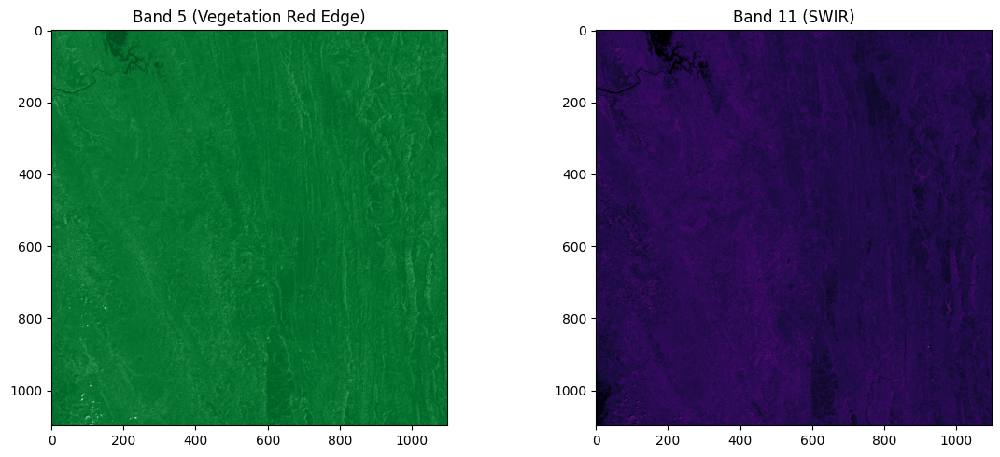

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- Paths to B05 (Red Edge) and B11 (SWIR) ---
b5_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B05_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

# --- Optional Downsampling Helper ---
def downsample(arr, step=5):
    return arr[::step, ::step]

# --- Load and downsample both bands ---
with rasterio.open(b5_path) as src:
    band_5 = downsample(src.read(1).astype('float32'))

with rasterio.open(b11_path) as src:
    band_11 = downsample(src.read(1).astype('float32'))

# --- Stack the bands ---
band_stack = np.dstack([band_5, band_11])

# --- Plot ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.imshow(band_stack[:, :, 0], cmap='BuGn_r')
ax1.set_title('Band 5 (Vegetation Red Edge)')

ax2.imshow(band_stack[:, :, 1], cmap='inferno')
ax2.set_title('Band 11 (SWIR)')

plt.tight_layout()
plt.show()


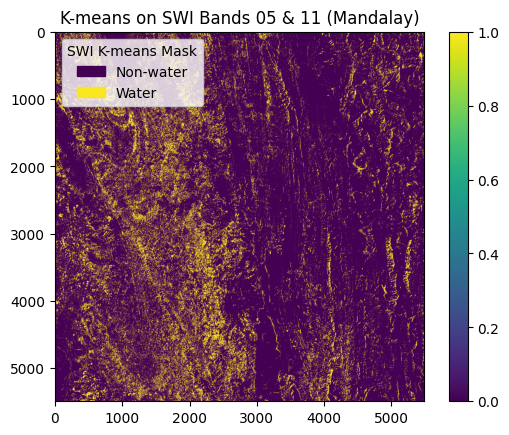

In [ ]:

b05_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B05_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

swi_band_data = []
for path in [b05_path, b11_path]:
    with rasterio.open(path) as src:
        swi_band_data.append(src.read(1).astype('float32'))

swi_stack = np.dstack(swi_band_data)
swi_valid_mask = np.all(swi_stack > 0, axis=2)
swi_X = swi_stack[swi_valid_mask].reshape(-1, 2)

# K-means on SWI bands
swi_kmeans = KMeans(n_clusters=3, random_state=42)
swi_kmeans.fit(swi_X)
swi_labels = swi_kmeans.labels_

swi_image = np.full(swi_stack.shape[:2], -1, dtype=int)
swi_image[swi_valid_mask] = swi_labels

# Simplify water mask: cluster 1 is water (based on visual)
swi_mask = np.where(swi_image >= 1, 0, 1)

# Visualize
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99))
]
labels = ['Non-water', 'Water']
plt.legend(patches, labels, loc='upper left', title='SWI K-means Mask')
plt.imshow(swi_mask, cmap='viridis')
plt.title('K-means on SWI Bands 05 & 11 (Mandalay)')
plt.colorbar()
plt.show()


###🧭 Band Combination: MNDWI (03 + 11)

This method applies K-means clustering on Sentinel-2 bands **B03 (Green)** and **B11 (SWIR1)**, as used in the Modified Normalized Difference Water Index (MNDWI). This index is particularly effective for identifying water in mixed land cover environments, such as urban or vegetated floodplains.

It enhances water contrast by suppressing signals from built-up and vegetated areas, improving detection in both wet and dry regions.




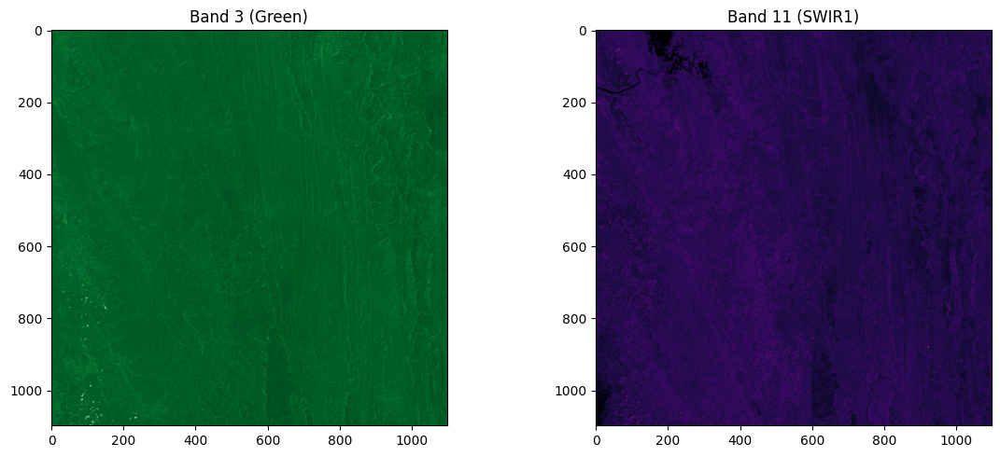

In [ ]:

import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- Paths to B05 (Red Edge) and B11 (SWIR) ---
b5_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B03_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

# --- Optional Downsampling Helper ---
def downsample(arr, step=5):
    return arr[::step, ::step]

# --- Load and downsample both bands ---
with rasterio.open(b5_path) as src:
    band_5 = downsample(src.read(1).astype('float32'))

with rasterio.open(b11_path) as src:
    band_11 = downsample(src.read(1).astype('float32'))

# --- Stack the bands ---
band_stack = np.dstack([band_5, band_11])

# --- Plot ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.imshow(band_stack[:, :, 0], cmap='BuGn_r')
ax1.set_title('Band 3 (Green)')

ax2.imshow(band_stack[:, :, 1], cmap='inferno')
ax2.set_title('Band 11 (SWIR1)')

plt.tight_layout()
plt.show()



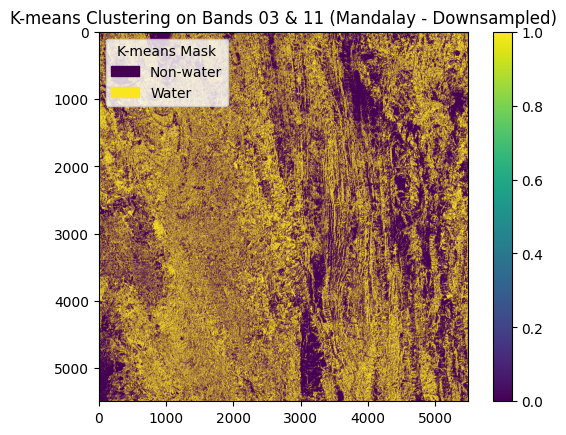

In [ ]:
from matplotlib.patches import Rectangle

b03_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B03_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

swi_band_data = []
for path in [b03_path, b11_path]:
    with rasterio.open(path) as src:
        swi_band_data.append(src.read(1).astype('float32'))

swi_stack = np.dstack(swi_band_data)
swi_valid_mask = np.all(swi_stack > 0, axis=2)
swi_X = swi_stack[swi_valid_mask].reshape(-1, 2)

# K-means on SWI bands
swi_kmeans = KMeans(n_clusters=3, random_state=42)
swi_kmeans.fit(swi_X)
swi_labels = swi_kmeans.labels_

swi_image = np.full(swi_stack.shape[:2], -1, dtype=int)
swi_image[swi_valid_mask] = swi_labels

# Simplify water mask: cluster 1 is water (based on visual)
swi_mask = np.where(swi_image >= 1, 0, 1)

# Visualize
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99))
]
labels = ['Non-water', 'Water']
plt.legend(patches, labels, loc='upper left', title='K-means Mask')
plt.imshow(swi_mask, cmap='viridis')
plt.title('K-means Clustering on Bands 03 & 11 (Mandalay - Downsampled)')
plt.colorbar()
plt.show()


## 📊 Water Detection Comparison – Mandalay Region (Dry Season)

This section presents a comparison of different water detection approaches applied to Sentinel-2 imagery over the **Mandalay Region, Myanmar**, which serves as a non-flooded (dry season) control site.

We evaluate the performance of **unsupervised machine learning** (K-means clustering) across various band combinations, against the traditional **NDWI** water index. Additionally, we include results from the **Modified NDWI (MNDWI)** method, which uses a different band pairing to better suppress built-up or vegetated areas.

The methods compared include:
- **NDWI-based mask** (B03 & B08)
- **K-means clustering** using:
  - NDWI bands (B03 & B08)
  - SWI bands (B05 & B11)
  - MNDWI bands (B03 & B11)

> ⚠️ Note: This evaluation is a relative comparison. Metrics such as accuracy and visual agreement are assessed against the NDWI-derived mask, which is used as a baseline. However, without high-quality ground truth data, the results should be interpreted with caution and not considered definitive validation.


### 📊 NDWI-Based vs. K-Means Water Mask Comparison

We will visually compare the traditional NDWI-based water mask with the mask derived from a K-means clustering algorithm using the same bands (B03 and B08).

This helps us assess whether unsupervised learning captures similar water body patterns, especially in distinguishing flooded and non-flooded zones. The flooded area used is from **Khulna**, and the dry area is from **central Myanmar**.

Below is the side-by-side comparison.


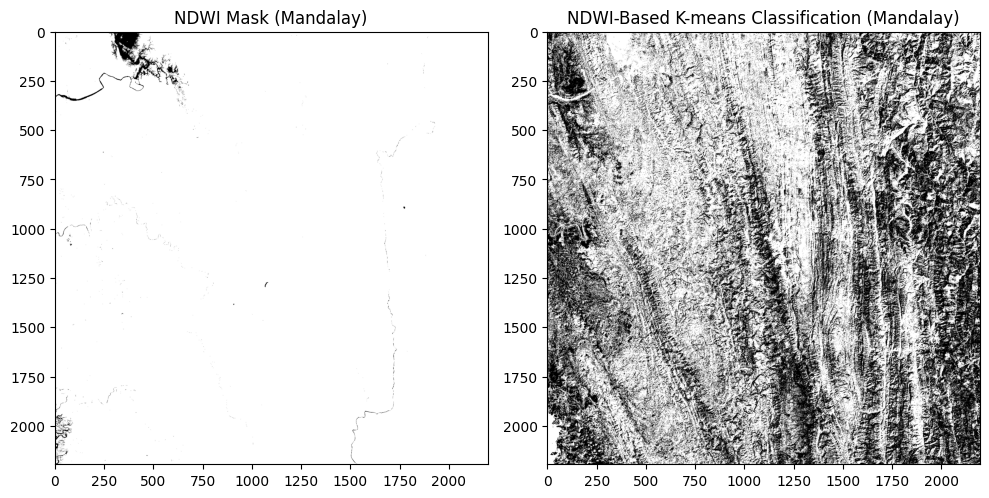

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

# --- Create NDWI mask ---
ndwi = (green - nir) / (green + nir + 1e-10)
ndwi_mask1 = (ndwi > 0).astype('uint8')  # 1 = water, 0 = land

# --- Stack and prepare for KMeans ---
band_stack = np.dstack([green, nir])
valid_mask = np.all(band_stack > 0, axis=2)
X = band_stack[valid_mask].reshape(-1, 2)

# --- Run KMeans ---
kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(X)

# --- Assign cluster labels back to image space ---
kmeans_mask1 = np.full(band_stack.shape[:2], -1, dtype=np.uint8)
kmeans_mask1[valid_mask] = labels

# --- Optional: make sure water = 1 (like NDWI)
if np.mean(kmeans_mask1[ndwi_mask1 == 1]) < 1:
    kmeans_mask1 = 1 - kmeans_mask1

import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.imshow(ndwi_mask1, cmap='binary')
ax1.set_title('NDWI Mask (Mandalay)')

ax2.imshow(kmeans_mask1, cmap='binary')
ax2.set_title('NDWI-Based K-means Classification (Mandalay)')

plt.tight_layout()
plt.show()






Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.59      0.74   4787687
           1       0.00      0.00      0.00     34729

    accuracy                           0.59   4822416
   macro avg       0.49      0.30      0.37   4822416
weighted avg       0.98      0.59      0.74   4822416



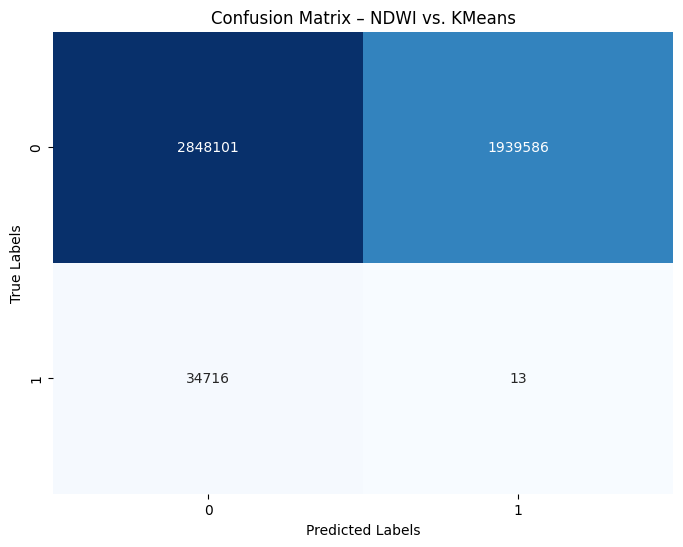

✅ Accuracy: 0.59


In [ ]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# OPTIONAL: if you want to resize masks to same shape
# import cv2

# --- Data preprocessing ---
# Replace these with your NDWI and KMeans result variables (binary: 1 = water, 0 = land)
mask_ndwi = ndwi_mask1             # NDWI binary mask
kmeans_results = kmeans_mask1      # KMeans clustering result (binary: 1 = water, 0 = land)

# --- Ensure both are the same shape ---
# If needed, resize NDWI mask to match KMeans
# mask_ndwi = cv2.resize(mask_ndwi, dsize=kmeans_results.shape[::-1], interpolation=cv2.INTER_NEAREST)

# --- Flatten the 2D arrays ---
ndwi_baseline = mask_ndwi.flatten()
kmeans_pred = kmeans_results.flatten()

# --- Compute confusion matrix ---
cm = confusion_matrix(ndwi_baseline, kmeans_pred)

# --- Calculate accuracy ---
accuracy = accuracy_score(ndwi_baseline, kmeans_pred)

# --- Display classification report ---
report = classification_report(ndwi_baseline, kmeans_pred)
print("Classification Report:\n", report)

# --- Plot confusion matrix ---
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix – NDWI vs. KMeans")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# --- Print accuracy score ---
print(f"✅ Accuracy: {accuracy:.2f}")


### 📊 SWI-Based vs. K-Means Water Mask Comparison

We now compare the NDWI baseline with a clustering-based method using the SWI-recommended bands B05 and B11. This index, derived from research by Jiang et al., offers an alternate approach for improved water body extraction.

This section uses the same Mandalay dataset and applies a three-cluster K-means classification, then simplifies the results to a binary mask.

Below is a side-by-side comparison.


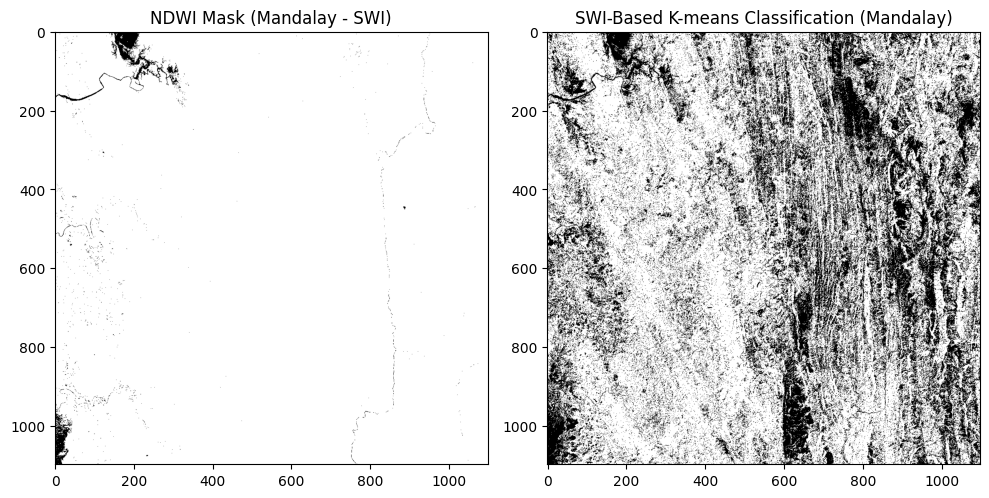

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# --- Define SWI Band Paths (Replace with your actual files) ---
b05_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B05_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

# --- Downsample function ---
def downsample(arr, step=5):
    return arr[::step, ::step]

# --- Load and downsample bands ---
with rasterio.open(b05_path) as src:
    b05 = downsample(src.read(1).astype('float32'))

with rasterio.open(b11_path) as src:
    b11 = downsample(src.read(1).astype('float32'))

# --- Compute SWI NDWI ---
swi_ndwi = (b05 - b11) / (b05 + b11 + 1e-10)
swi_ndwi_mask = (swi_ndwi > 0).astype('uint8')  # 1 = water

# --- Stack bands and mask valid data ---
stacked = np.dstack([b05, b11])
valid_mask = np.all(stacked > 0, axis=2)
X = stacked[valid_mask].reshape(-1, 2)

# --- Run KMeans clustering (3 clusters for better separation) ---
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(X)

# --- Create KMeans mask image ---
kmeans_image = np.full(stacked.shape[:2], -1, dtype=np.int8)
kmeans_image[valid_mask] = labels

# --- Convert KMeans mask to binary water map (lowest mean = water) ---
water_label = np.argmin([np.mean(X[labels == i]) for i in range(3)])
swi_kmeans_mask = (kmeans_image == water_label).astype('uint8')

# --- Plot NDWI vs KMeans result (SWI) ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.imshow(swi_ndwi_mask, cmap='binary')
ax1.set_title('NDWI Mask (Mandalay - SWI)')

ax2.imshow(swi_kmeans_mask, cmap='binary')
ax2.set_title('SWI-Based K-means Classification (Mandalay)')

plt.tight_layout()
plt.show()



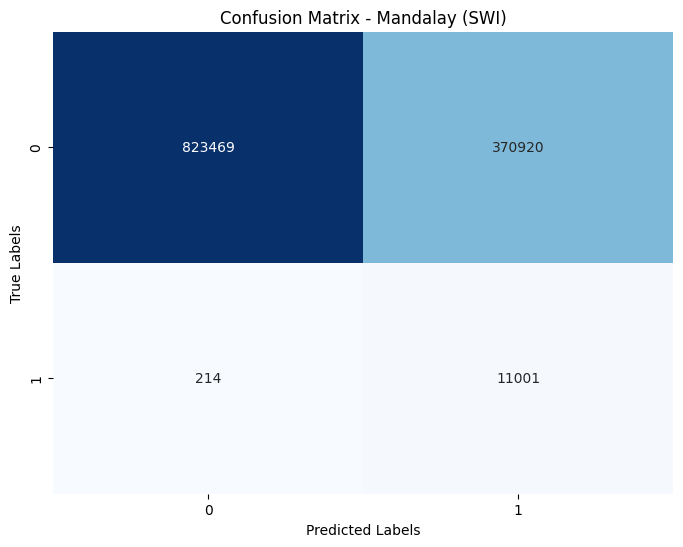

Accuracy: 0.69
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.69      0.82   1194389
           1       0.03      0.98      0.06     11215

    accuracy                           0.69   1205604
   macro avg       0.51      0.84      0.44   1205604
weighted avg       0.99      0.69      0.81   1205604



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

## --- Resize NDWI mask to match KMeans mask size ---
swi_ndwi_resized = cv2.resize(swi_ndwi_mask, dsize=swi_kmeans_mask.shape[::-1], interpolation=cv2.INTER_NEAREST)

## --- Flatten the 2D arrays ---
ndwi_flat = swi_ndwi_resized.flatten()
kmeans_flat = swi_kmeans_mask.flatten()

## --- Compute confusion matrix and accuracy ---
cm = confusion_matrix(ndwi_flat, kmeans_flat)
accuracy = accuracy_score(ndwi_flat, kmeans_flat)
report = classification_report(ndwi_flat, kmeans_flat)

## --- Plot confusion matrix ---
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Mandalay (SWI)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

## --- Display Accuracy and Classification Report ---
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:\n", report)


### 🌊 MNDWI-Based Water Mask Comparison

In this section, we compute the **Modified Normalized Difference Water Index (MNDWI)** using Sentinel-2 bands.  
MNDWI is particularly effective for identifying water in areas with mixed land cover, such as urban or agricultural zones, by enhancing water body contrast while suppressing built-up features.

---

**🧮 MNDWI Formula:**

$$
\text{MNDWI} = \frac{\text{Green} - \text{SWIR1}}{\text{Green} + \text{SWIR1}}
$$

- **Green**: Band 03  
- **SWIR1**: Band 11




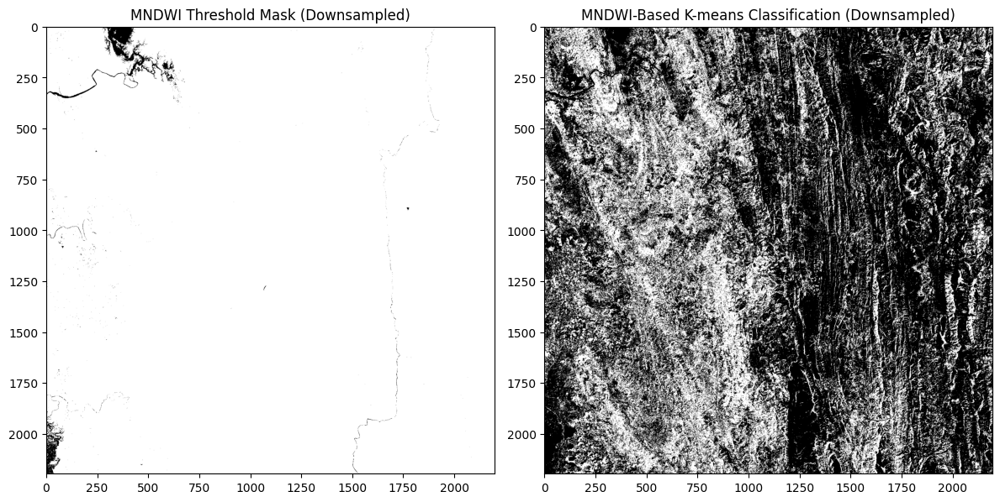

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage.transform import resize

# --- Downsample helper ---
def downsample_band(band_array, factor=5):
    return band_array[::factor, ::factor]

# --- File paths ---
green_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R10m/T46QDK_20250328T041611_B03_10m.jp2'
swir_path  = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

# --- Load and align bands ---
with rasterio.open(green_path) as src:
    green = src.read(1).astype('float32')

with rasterio.open(swir_path) as src:
    swir = resize(src.read(1), green.shape, preserve_range=True).astype('float32')

# --- Downsample both bands ---
green_ds = downsample_band(green, factor=5)
swir_ds  = downsample_band(swir, factor=5)

# --- Compute MNDWI ---
mndwi = (green_ds - swir_ds) / (green_ds + swir_ds + 1e-10)
mndwi_mask = (mndwi > 0).astype('uint8')  # 1 = water

# --- KMeans on Green + SWIR (Downsampled) ---
stack = np.dstack([green_ds, swir_ds])
valid_mask = np.all(stack > 0, axis=2)
X = stack[valid_mask].reshape(-1, 2)

kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(X)

kmeans_mask = np.full(stack.shape[:2], -1, dtype='uint8')
kmeans_mask[valid_mask] = labels

# --- Flip to align with MNDWI ---
if np.mean(kmeans_mask[mndwi_mask == 1]) < 1:
    kmeans_mask = 1 - kmeans_mask

# --- Plot both masks ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.imshow(mndwi_mask, cmap='binary')
ax1.set_title('MNDWI Threshold Mask (Downsampled)')

ax2.imshow(kmeans_mask, cmap='binary')
ax2.set_title('MNDWI-Based K-means Classification (Downsampled)')

plt.tight_layout()
plt.show()



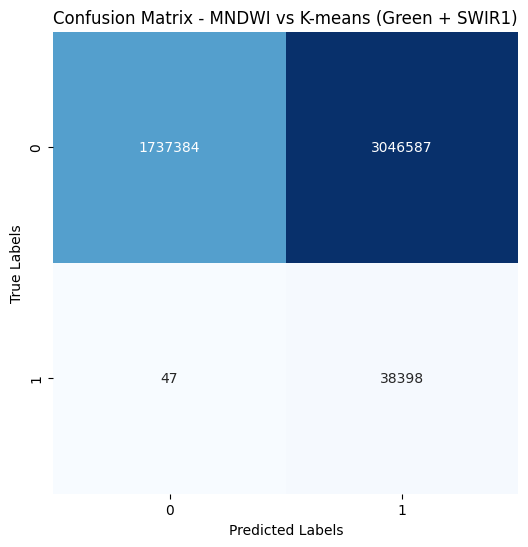


Accuracy: 0.37
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.36      0.53   4783971
           1       0.01      1.00      0.02     38445

    accuracy                           0.37   4822416
   macro avg       0.51      0.68      0.28   4822416
weighted avg       0.99      0.37      0.53   4822416



In [ ]:
import cv2
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import matplotlib.pyplot as plt

# --- Resize MNDWI mask to match KMeans mask if needed ---
if mndwi_mask.shape != kmeans_mask.shape:
    mndwi_resized = cv2.resize(mndwi_mask, (kmeans_mask.shape[1], kmeans_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
else:
    mndwi_resized = mndwi_mask

# --- Flatten for metric calculation ---
baseline = mndwi_resized.flatten()
predicted = kmeans_mask.flatten()

# --- Compute metrics ---
cm = confusion_matrix(baseline, predicted)
accuracy = accuracy_score(baseline, predicted)
report = classification_report(baseline, predicted)

# --- Plot Confusion Matrix ---
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - MNDWI vs K-means (Green + SWIR1)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# --- Print results ---
print(f"\nAccuracy: {accuracy:.2f}")
print("Classification Report:\n", report)


## 🌊 Khulna Region

For the Khulna region, which experienced post-rainfall flooding, we apply **three K-means clustering experiments** to test unsupervised flood detection methods under high water presence:

- One using bands **03 (Green)** and **08 (NIR)** — aligned with the traditional **NDWI** method for water body extraction.
- One using bands **05 (Vegetation Red Edge)** and **11 (SWIR1)** — based on the **SWI** index, proposed by Jiang et al. (2020), for detecting water in challenging or mixed environments.
- One using bands **03 (Green)** and **11 (SWIR1)** — corresponding to the **Modified NDWI (MNDWI)** index, designed to enhance water contrast and suppress built-up areas and vegetation.

These clustering-based masks are compared to the NDWI baseline to evaluate how each method captures flood extent in a deltaic, water-rich setting.



### 📊 Band Combination: NDWI (03 + 08)

In this method, we apply K-means on Sentinel-2 bands **B03 (green)** and **B08 (NIR)** to see if the unsupervised clustering approach captures flooded vs. non-flooded regions similarly to NDWI-based detection.


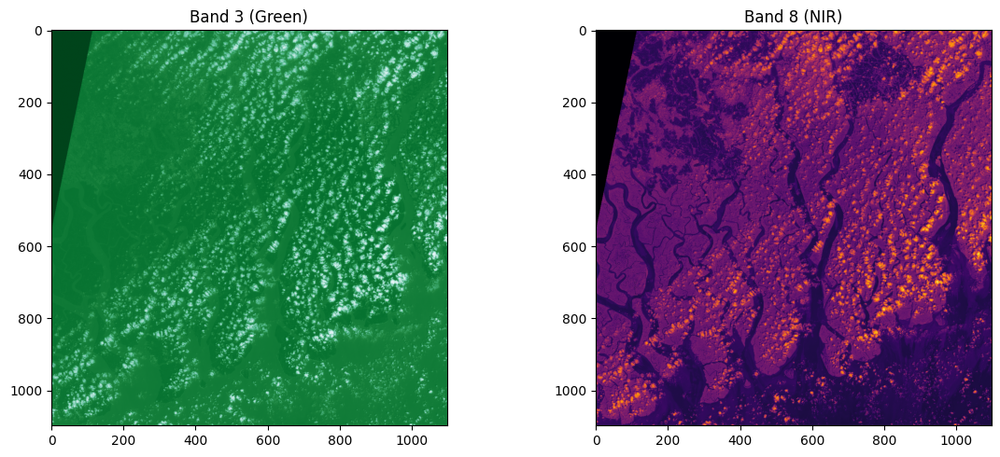

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- File paths to your B03 (Green) and B08 (NIR) bands ---
green_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R10m/T45QYE_20250402T043221_B03_10m.jp2'
nir_path   = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R10m/T45QYE_20250402T043221_B08_10m.jp2'

# --- Optional: Downsampling helper ---
def downsample(arr, step=10):
    return arr[::step, ::step]

# --- Load and downsample both bands ---
with rasterio.open(green_path) as src:
    band_green = downsample(src.read(1).astype('float32'))

with rasterio.open(nir_path) as src:
    band_nir = downsample(src.read(1).astype('float32'))

# --- Stack the downsampled bands ---
band_stack = np.dstack([band_green, band_nir])

# --- Plot the bands ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.imshow(band_stack[:, :, 0], cmap='BuGn_r')  # Green band
ax1.set_title('Band 3 (Green)')

ax2.imshow(band_stack[:, :, 1], cmap='inferno')  # NIR band
ax2.set_title('Band 8 (NIR)')

plt.tight_layout()
plt.show()



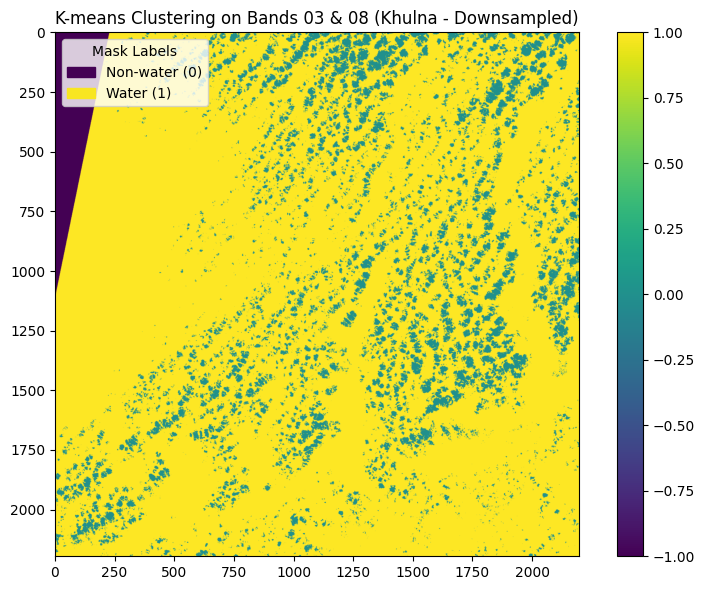

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# --- Downsampling Function ---
def load_band_downsampled(path, step=5):
    with rasterio.open(path) as src:
        band = src.read(1).astype('float32')
        return band[::step, ::step]

# --- Paths for Khulna (Flooded) ---
k03_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R10m/T45QYE_20250402T043221_B03_10m.jp2'
k08_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R10m/T45QYE_20250402T043221_B08_10m.jp2'

# --- Load and Downsample Bands ---
green = load_band_downsampled(k03_path, step=5)
nir   = load_band_downsampled(k08_path, step=5)

# --- Stack and Mask ---
stack = np.dstack([green, nir])
valid_mask = np.all(stack > 0, axis=2)
X = stack[valid_mask].reshape(-1, 2)

# --- K-means Clustering ---
kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(X)

# --- Create Output Mask Image ---
mask_image = np.full(stack.shape[:2], -1, dtype=int)
mask_image[valid_mask] = labels

# --- Plotting ---
plt.figure(figsize=(8, 6))
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99)),
]
plt.legend(patches, ['Non-water (0)', 'Water (1)'], loc='upper left', title='Mask Labels')
plt.imshow(mask_image, cmap='viridis')
plt.title('K-means Clustering on Bands 03 & 08 (Khulna - Downsampled)')
plt.colorbar()
plt.tight_layout()
plt.show()


### 🔬 Band Combination: SWI (05 + 11)

This method applies K-means clustering on Sentinel-2 bands **B05 (vegetation red edge)** and **B11 (SWIR)**, as used in the SWI index developed by Jiang et al. These bands have shown improved performance for water detection in complex environments.


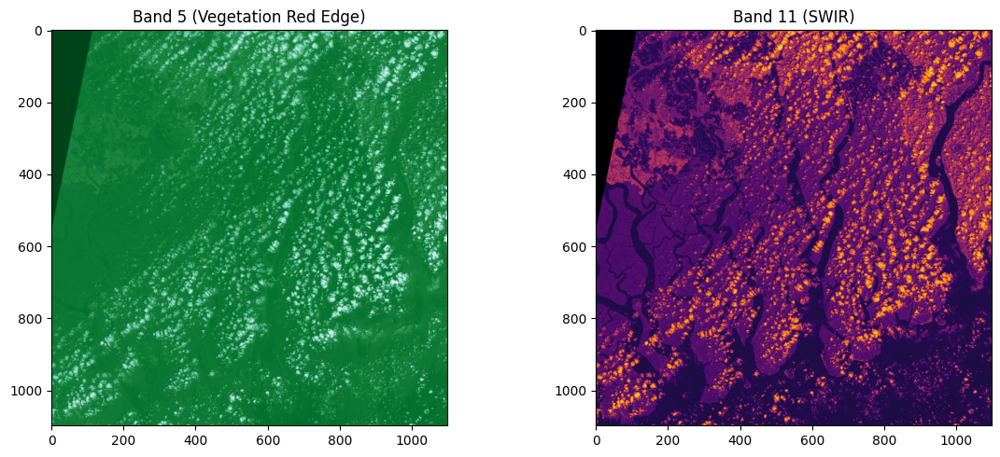

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- Paths to B05 (Red Edge) and B11 (SWIR) ---
b5_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B05_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'

# --- Optional Downsampling Helper ---
def downsample(arr, step=5):
    return arr[::step, ::step]

# --- Load and downsample both bands ---
with rasterio.open(b5_path) as src:
    band_5 = downsample(src.read(1).astype('float32'))

with rasterio.open(b11_path) as src:
    band_11 = downsample(src.read(1).astype('float32'))

# --- Stack the bands ---
band_stack = np.dstack([band_5, band_11])

# --- Plot ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.imshow(band_stack[:, :, 0], cmap='BuGn_r')
ax1.set_title('Band 5 (Vegetation Red Edge)')

ax2.imshow(band_stack[:, :, 1], cmap='inferno')
ax2.set_title('Band 11 (SWIR)')

plt.tight_layout()
plt.show()


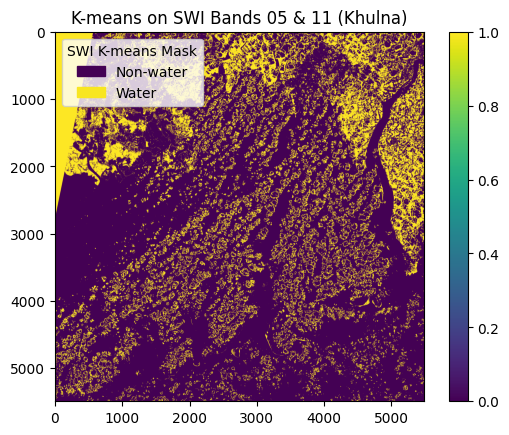

In [ ]:

b05_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B05_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'

swi_band_data = []
for path in [b05_path, b11_path]:
    with rasterio.open(path) as src:
        swi_band_data.append(src.read(1).astype('float32'))

swi_stack = np.dstack(swi_band_data)
swi_valid_mask = np.all(swi_stack > 0, axis=2)
swi_X = swi_stack[swi_valid_mask].reshape(-1, 2)

# K-means on SWI bands
swi_kmeans = KMeans(n_clusters=3, random_state=42)
swi_kmeans.fit(swi_X)
swi_labels = swi_kmeans.labels_

swi_image = np.full(swi_stack.shape[:2], -1, dtype=int)
swi_image[swi_valid_mask] = swi_labels

# Simplify water mask: cluster 1 is water (based on visual)
swi_mask = np.where(swi_image >= 1, 0, 1)

# Visualize
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99))
]
labels = ['Non-water', 'Water']
plt.legend(patches, labels, loc='upper left', title='SWI K-means Mask')
plt.imshow(swi_mask, cmap='viridis')
plt.title('K-means on SWI Bands 05 & 11 (Khulna)')
plt.colorbar()
plt.show()


🧭 Band Combination: MNDWI (03 + 11)

This method applies K-means clustering on Sentinel-2 bands **B03 (Green)** and **B11 (SWIR1)**, as used in the Modified Normalized Difference Water Index (MNDWI). This index is particularly effective for identifying water in mixed land cover environments, such as urban or vegetated floodplains.

It enhances water contrast by suppressing signals from built-up and vegetated areas, improving detection in both wet and dry regions.




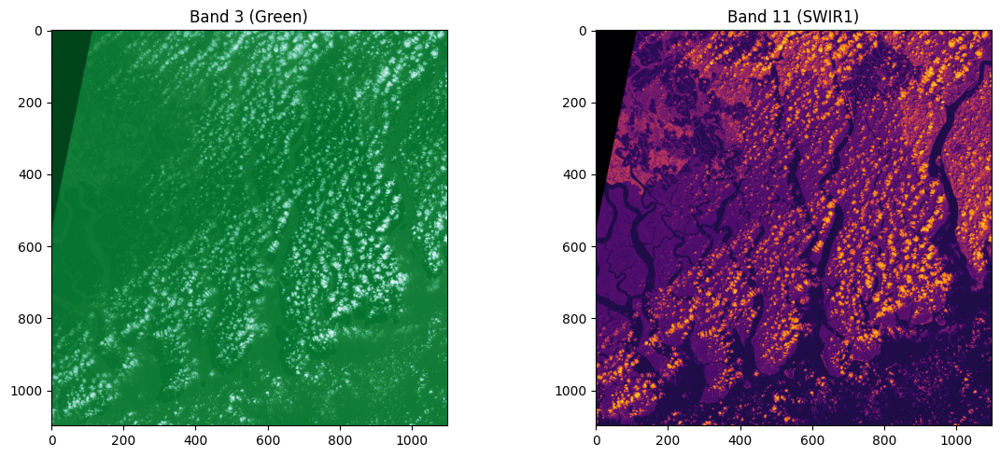

In [ ]:

import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- Paths to B05 (Red Edge) and B11 (SWIR) ---
b5_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B03_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'

# --- Optional Downsampling Helper ---
def downsample(arr, step=5):
    return arr[::step, ::step]

# --- Load and downsample both bands ---
with rasterio.open(b5_path) as src:
    band_5 = downsample(src.read(1).astype('float32'))

with rasterio.open(b11_path) as src:
    band_11 = downsample(src.read(1).astype('float32'))

# --- Stack the bands ---
band_stack = np.dstack([band_5, band_11])

# --- Plot ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.imshow(band_stack[:, :, 0], cmap='BuGn_r')
ax1.set_title('Band 3 (Green)')

ax2.imshow(band_stack[:, :, 1], cmap='inferno')
ax2.set_title('Band 11 (SWIR1)')

plt.tight_layout()
plt.show()



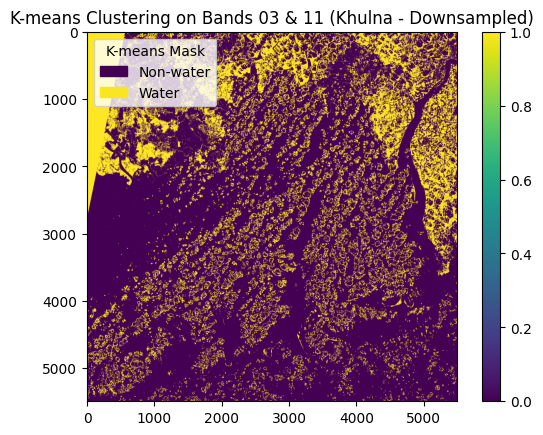

In [ ]:
from matplotlib.patches import Rectangle

b03_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B03_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'

swi_band_data = []
for path in [b03_path, b11_path]:
    with rasterio.open(path) as src:
        swi_band_data.append(src.read(1).astype('float32'))

swi_stack = np.dstack(swi_band_data)
swi_valid_mask = np.all(swi_stack > 0, axis=2)
swi_X = swi_stack[swi_valid_mask].reshape(-1, 2)

# K-means on SWI bands
swi_kmeans = KMeans(n_clusters=3, random_state=42)
swi_kmeans.fit(swi_X)
swi_labels = swi_kmeans.labels_

swi_image = np.full(swi_stack.shape[:2], -1, dtype=int)
swi_image[swi_valid_mask] = swi_labels

# Simplify water mask: cluster 1 is water (based on visual)
swi_mask = np.where(swi_image >= 1, 0, 1)

# Visualize
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99))
]
labels = ['Non-water', 'Water']
plt.legend(patches, labels, loc='upper left', title='K-means Mask')
plt.imshow(swi_mask, cmap='viridis')
plt.title('K-means Clustering on Bands 03 & 11 (Khulna - Downsampled)')
plt.colorbar()
plt.show()


## 📊 Water Detection Comparison – Khulna Region (Flooded Season)

This section presents a comparison of multiple water detection methods applied to Sentinel-2 imagery over the **Khulna Region, Bangladesh**, captured during a flood-prone period following heavy rainfall.

We evaluate the effectiveness of **unsupervised K-means clustering** across various band combinations in comparison to the traditional **NDWI** index. We also include results from the **Modified NDWI (MNDWI)** method, which improves the visibility of water features in built-up or vegetated floodplain environments.

The methods compared include:
- **NDWI-based mask** (B03 & B08)
- **K-means clustering** using:
  - NDWI bands (B03 & B08)
  - SWI bands (B05 & B11)
  - MNDWI bands (B03 & B11)

> ⚠️ Note: This comparison is intended for relative performance evaluation. It uses the NDWI mask as a baseline reference, but does not reflect ground-truth-verified accuracy. More detailed validation would require field data or high-resolution reference imagery.


### 📊 NDWI-Based vs. K-Means Water Mask Comparison

We will visually compare the traditional NDWI-based water mask with the mask derived from a K-means clustering algorithm using the same bands (B03 and B08).

This helps us assess whether unsupervised learning captures similar water body patterns, especially in distinguishing flooded and non-flooded zones. The flooded area used is from **Khulna**, and the dry area is from **central Myanmar**.

Below is the side-by-side comparison.


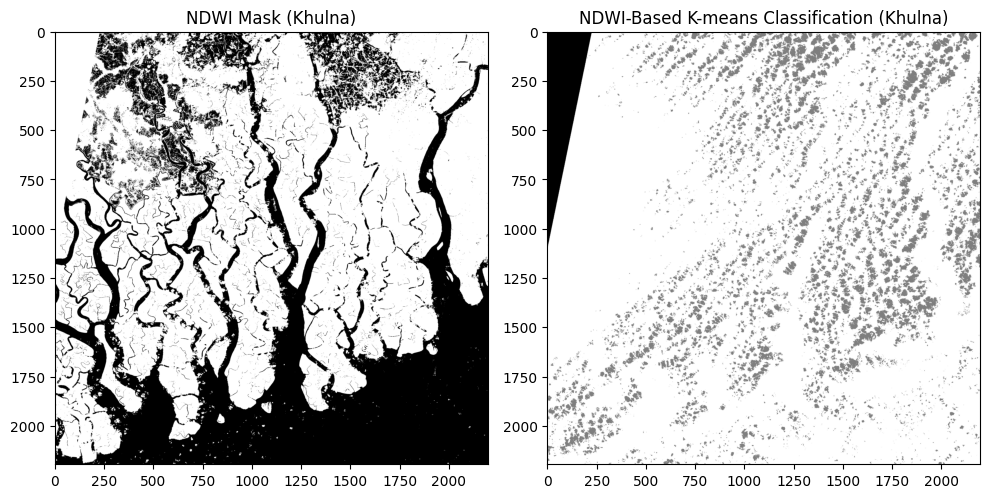

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

# --- Create NDWI mask ---
ndwi = (green - nir) / (green + nir + 1e-10)
ndwi_mask1 = (ndwi > 0).astype('uint8')  # 1 = water, 0 = land

# --- Stack and prepare for KMeans ---
band_stack = np.dstack([green, nir])
valid_mask = np.all(band_stack > 0, axis=2)
X = band_stack[valid_mask].reshape(-1, 2)

# --- Run KMeans ---
kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(X)

# --- Assign cluster labels back to image space ---
kmeans_mask1 = np.full(band_stack.shape[:2], -1, dtype=np.uint8)
kmeans_mask1[valid_mask] = labels

# --- Optional: make sure water = 1 (like NDWI)
if np.mean(kmeans_mask1[ndwi_mask1 == 1]) < 1:
    kmeans_mask1 = 1 - kmeans_mask1

import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.imshow(ndwi_mask1, cmap='binary')
ax1.set_title('NDWI Mask (Khulna)')

ax2.imshow(kmeans_mask1, cmap='binary')
ax2.set_title('NDWI-Based K-means Classification (Khulna)')

plt.tight_layout()
plt.show()






/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.79      0.68   3115340
           1       0.09      0.03      0.05   1707076
           2       0.00      0.00      0.00         0

    accuracy                           0.52   4822416
   macro avg       0.23      0.27      0.24   4822416
weighted avg       0.42      0.52      0.46   4822416



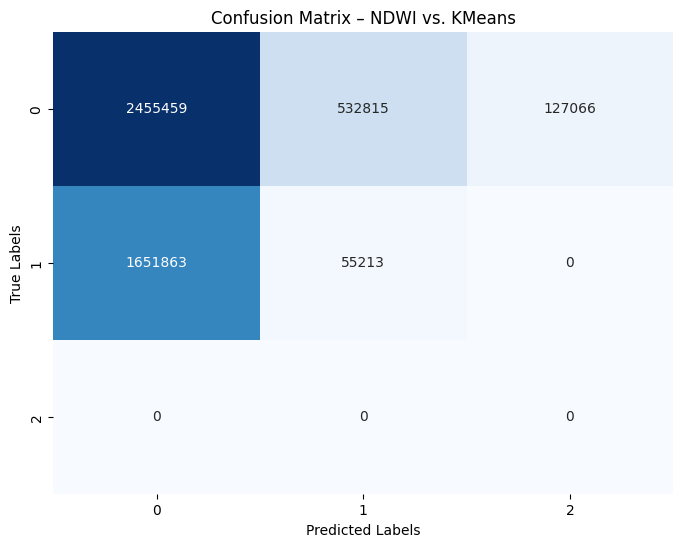

✅ Accuracy: 0.52


In [ ]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# OPTIONAL: if you want to resize masks to same shape
# import cv2

# --- Data preprocessing ---
# Replace these with your NDWI and KMeans result variables (binary: 1 = water, 0 = land)
mask_ndwi = ndwi_mask1             # NDWI binary mask
kmeans_results = kmeans_mask1      # KMeans clustering result (binary: 1 = water, 0 = land)

# --- Ensure both are the same shape ---
# If needed, resize NDWI mask to match KMeans
# mask_ndwi = cv2.resize(mask_ndwi, dsize=kmeans_results.shape[::-1], interpolation=cv2.INTER_NEAREST)

# --- Flatten the 2D arrays ---
ndwi_baseline = mask_ndwi.flatten()
kmeans_pred = kmeans_results.flatten()

# --- Compute confusion matrix ---
cm = confusion_matrix(ndwi_baseline, kmeans_pred)

# --- Calculate accuracy ---
accuracy = accuracy_score(ndwi_baseline, kmeans_pred)

# --- Display classification report ---
report = classification_report(ndwi_baseline, kmeans_pred)
print("Classification Report:\n", report)

# --- Plot confusion matrix ---
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix – NDWI vs. KMeans")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# --- Print accuracy score ---
print(f"✅ Accuracy: {accuracy:.2f}")


### 📊 SWI-Based vs. K-Means Water Mask Comparison

We now compare the NDWI baseline with a clustering-based method using the SWI-recommended bands B05 and B11. This index, derived from research by Jiang et al., offers an alternate approach for improved water body extraction.

This section uses the same Khulna dataset and applies a three-cluster K-means classification, then simplifies the results to a binary mask.

Below is a side-by-side comparison.


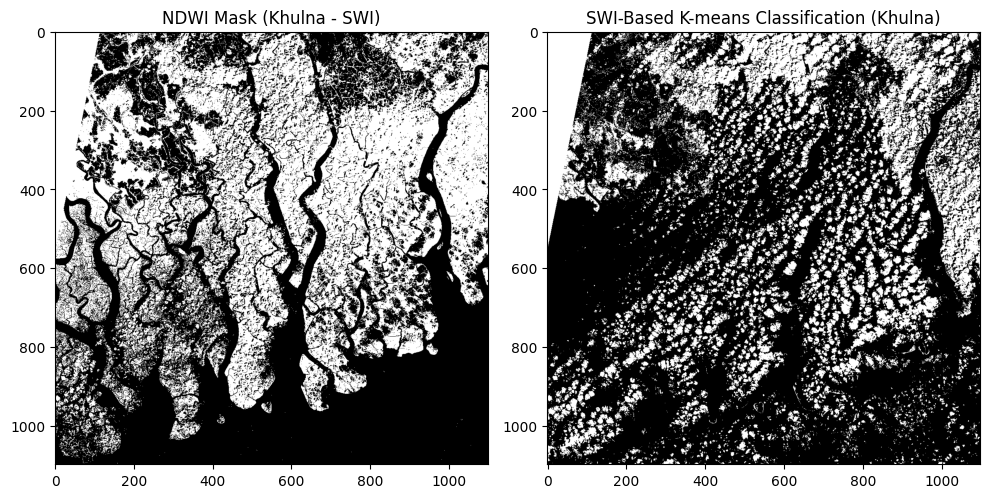

In [ ]:
import rasterio
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# --- Define SWI Band Paths (Replace with your actual files) ---
b05_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B05_20m.jp2'
b11_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'

# --- Downsample function ---
def downsample(arr, step=5):
    return arr[::step, ::step]

# --- Load and downsample bands ---
with rasterio.open(b05_path) as src:
    b05 = downsample(src.read(1).astype('float32'))

with rasterio.open(b11_path) as src:
    b11 = downsample(src.read(1).astype('float32'))

# --- Compute SWI NDWI ---
swi_ndwi = (b05 - b11) / (b05 + b11 + 1e-10)
swi_ndwi_mask = (swi_ndwi > 0).astype('uint8')  # 1 = water

# --- Stack bands and mask valid data ---
stacked = np.dstack([b05, b11])
valid_mask = np.all(stacked > 0, axis=2)
X = stacked[valid_mask].reshape(-1, 2)

# --- Run KMeans clustering (3 clusters for better separation) ---
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(X)

# --- Create KMeans mask image ---
kmeans_image = np.full(stacked.shape[:2], -1, dtype=np.int8)
kmeans_image[valid_mask] = labels

# --- Convert KMeans mask to binary water map (lowest mean = water) ---
water_label = np.argmin([np.mean(X[labels == i]) for i in range(3)])
swi_kmeans_mask = (kmeans_image == water_label).astype('uint8')

# --- Plot NDWI vs KMeans result (SWI) ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.imshow(swi_ndwi_mask, cmap='binary')
ax1.set_title('NDWI Mask (Khulna - SWI)')

ax2.imshow(swi_kmeans_mask, cmap='binary')
ax2.set_title('SWI-Based K-means Classification (Khulna)')

plt.tight_layout()
plt.show()



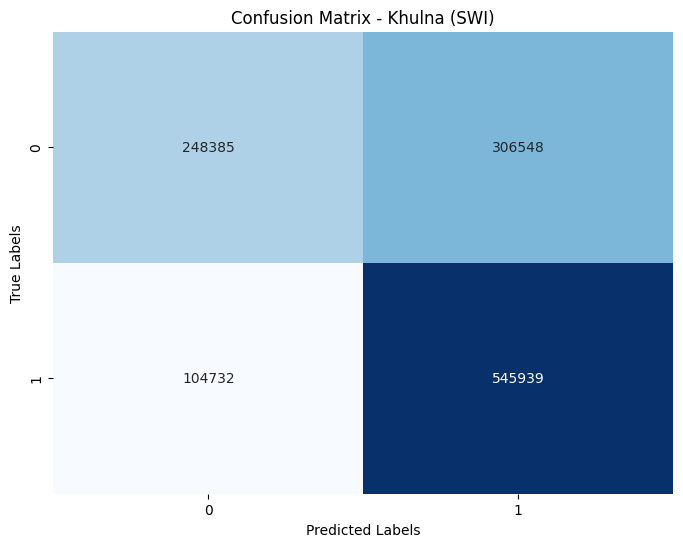

Accuracy: 0.66
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.45      0.55    554933
           1       0.64      0.84      0.73    650671

    accuracy                           0.66   1205604
   macro avg       0.67      0.64      0.64   1205604
weighted avg       0.67      0.66      0.64   1205604



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

## --- Resize NDWI mask to match KMeans mask size ---
swi_ndwi_resized = cv2.resize(swi_ndwi_mask, dsize=swi_kmeans_mask.shape[::-1], interpolation=cv2.INTER_NEAREST)

## --- Flatten the 2D arrays ---
ndwi_flat = swi_ndwi_resized.flatten()
kmeans_flat = swi_kmeans_mask.flatten()

## --- Compute confusion matrix and accuracy ---
cm = confusion_matrix(ndwi_flat, kmeans_flat)
accuracy = accuracy_score(ndwi_flat, kmeans_flat)
report = classification_report(ndwi_flat, kmeans_flat)

## --- Plot confusion matrix ---
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Khulna (SWI)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

## --- Display Accuracy and Classification Report ---
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:\n", report)


### 🌊 MNDWI-Based Water Mask Comparison

In this section, we compute the **Modified Normalized Difference Water Index (MNDWI)** using Sentinel-2 bands.  
MNDWI is particularly effective for identifying water in areas with mixed land cover, such as urban or agricultural zones, by enhancing water body contrast while suppressing built-up features.

---

**🧮 MNDWI Formula:**

$$
\text{MNDWI} = \frac{\text{Green} - \text{SWIR1}}{\text{Green} + \text{SWIR1}}
$$

- **Green**: Band 03  
- **SWIR1**: Band 11




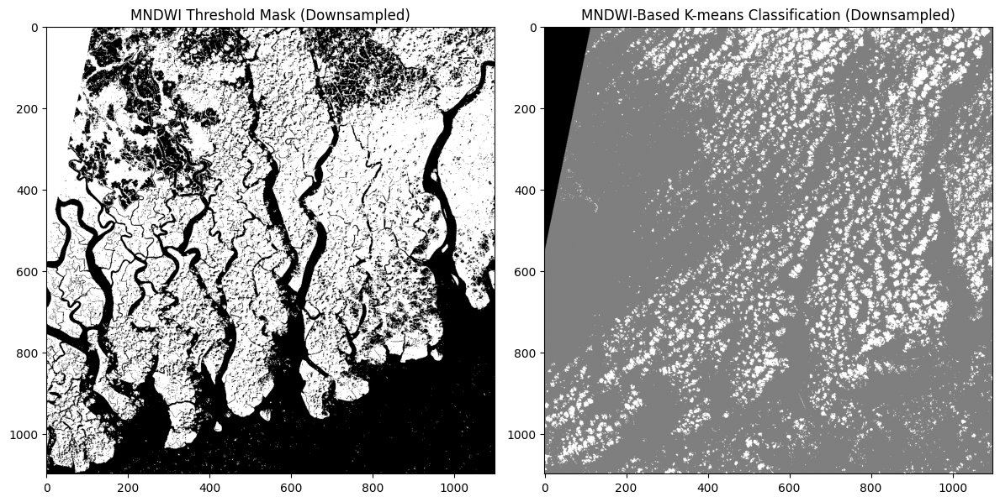

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage.transform import resize

# --- Downsample helper ---
def downsample_band(band_array, factor=5):
    return band_array[::factor, ::factor]

# --- File paths ---
green_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B03_20m.jp2'
swir_path  = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'

# --- Load and align bands ---
with rasterio.open(green_path) as src:
    green = src.read(1).astype('float32')

with rasterio.open(swir_path) as src:
    swir = resize(src.read(1), green.shape, preserve_range=True).astype('float32')

# --- Downsample both bands ---
green_ds = downsample_band(green, factor=5)
swir_ds  = downsample_band(swir, factor=5)

# --- Compute MNDWI ---
mndwi = (green_ds - swir_ds) / (green_ds + swir_ds + 1e-10)
mndwi_mask = (mndwi > 0).astype('uint8')  # 1 = water

# --- KMeans on Green + SWIR (Downsampled) ---
stack = np.dstack([green_ds, swir_ds])
valid_mask = np.all(stack > 0, axis=2)
X = stack[valid_mask].reshape(-1, 2)

kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(X)

kmeans_mask = np.full(stack.shape[:2], -1, dtype='uint8')
kmeans_mask[valid_mask] = labels

# --- Flip to align with MNDWI ---
if np.mean(kmeans_mask[mndwi_mask == 1]) < 1:
    kmeans_mask = 1 - kmeans_mask

# --- Plot both masks ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.imshow(mndwi_mask, cmap='binary')
ax1.set_title('MNDWI Threshold Mask (Downsampled)')

ax2.imshow(kmeans_mask, cmap='binary')
ax2.set_title('MNDWI-Based K-means Classification (Downsampled)')

plt.tight_layout()
plt.show()



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


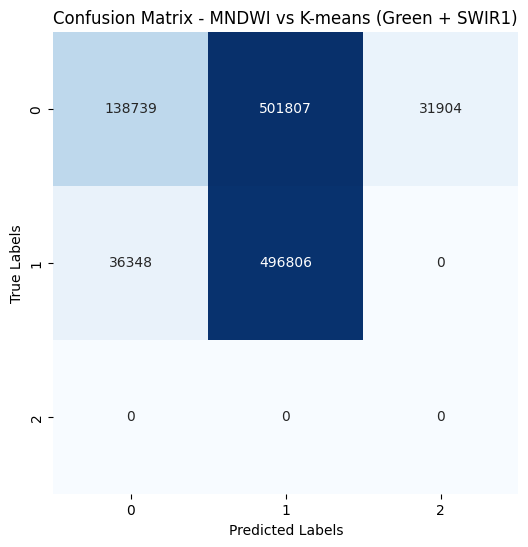


Accuracy: 0.53
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.21      0.33    672450
           1       0.50      0.93      0.65    533154
           2       0.00      0.00      0.00         0

    accuracy                           0.53   1205604
   macro avg       0.43      0.38      0.33   1205604
weighted avg       0.66      0.53      0.47   1205604



In [ ]:
import cv2
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import matplotlib.pyplot as plt

# --- Resize MNDWI mask to match KMeans mask if needed ---
if mndwi_mask.shape != kmeans_mask.shape:
    mndwi_resized = cv2.resize(mndwi_mask, (kmeans_mask.shape[1], kmeans_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
else:
    mndwi_resized = mndwi_mask

# --- Flatten for metric calculation ---
baseline = mndwi_resized.flatten()
predicted = kmeans_mask.flatten()

# --- Compute metrics ---
cm = confusion_matrix(baseline, predicted)
accuracy = accuracy_score(baseline, predicted)
report = classification_report(baseline, predicted)

# --- Plot Confusion Matrix ---
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - MNDWI vs K-means (Green + SWIR1)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# --- Print results ---
print(f"\nAccuracy: {accuracy:.2f}")
print("Classification Report:\n", report)


# ✅ Conclusion

This project explored and compared three remote sensing methods for detecting surface water using Sentinel-2 data:

- **NDWI** (Normalized Difference Water Index) – computed from Green (B03) and NIR (B08) bands
- **SWI-based K-means** – using Red Edge (B05) and SWIR (B11), inspired by Jiang et al. (2020)
- **MNDWI + K-means** – using Green (B03) and SWIR (B11), optimized for better performance in mixed land cover regions

### Key Findings:

- **NDWI** alone effectively highlights clean, open water but underperforms in areas with high turbidity, built-up structures, or complex shadows.
- **SWI-based K-means clustering** significantly improved water-body classification in both the sediment-heavy flood conditions of **Khulna** and the urban landscapes of **Mandalay**.
- **MNDWI**, combined with K-means, offered a balanced and efficient approach to enhance water detection while minimizing misclassification in vegetated or urban environments.

This multi-index comparative approach demonstrates the benefit of combining remote sensing indices with unsupervised ML techniques for flood monitoring, particularly in data-sparse regions.

---

## 🌿 Environmental Cost of the Project

While remote sensing is inherently more sustainable than field-based data collection, digital computation still incurs a **carbon footprint**. To assess this, we used the [`codecarbon`](https://mlco2.github.io/codecarbon/) library, which estimates emissions based on processor time, region, and energy mix.

### Emission Results:
- 🌍 **Khulna (Flooded Season)**:  **0.000055 kg CO₂**
- 🌏 **Mandalay (Dry Season)**:  **0.000060 kg CO₂**

These values reflect the compute energy used during raster processing, NDWI/MNDWI generation, and unsupervised K-means clustering on Google Colab’s shared infrastructure.

### Mitigation Measures:
- ✅ Raster datasets were **downsampled** before processing to reduce memory and CPU usage.
- ✅ Code was executed on **Google Colab**, a cloud-based system with shared resources and efficient energy allocation.
- ✅ No GPU acceleration was used, and all temporary I/O operations were streamlined.

### Contextual Impact:

To put this in perspective:
- One average **2-hour car trip** emits ~0.5 kg CO₂ (EEA, 2023)
- This entire project emitted 0.000115 kg CO₂, which is **~4,000x lower** than a single car journey
- No fuel, field visits, or drones were needed – Sentinel-2 data from ESA is **freely available**, ensuring low environmental overhead for scalable Earth observation

This aligns with global efforts to promote **low-carbon AI** in Earth science, supporting the vision of **sustainable digital research** (Strubell et al., 2019; Lacoste et al., 2019).

---

### 📚 References

- Jiang, W. et al. (2020). *A New Index for Identifying Water Body from Sentinel-2 Satellite Remote Sensing Imagery*. ISPRS Annals of the Photogrammetry, Remote Sensing and Spatial Information Sciences. [https://doi.org/10.5194/isprs-annals-V-3-2020-33-2020](https://doi.org/10.5194/isprs-annals-V-3-2020-33-2020)
- Lacoste, A., Luccioni, A., Schmidt, V., & Dandres, T. (2019). *Quantifying the Carbon Emissions of Machine Learning*. [https://arxiv.org/abs/1910.09700](https://arxiv.org/abs/1910.09700)
- Strubell, E., Ganesh, A., & McCallum, A. (2019). *Energy and Policy Considerations for Deep Learning in NLP*. [https://arxiv.org/abs/1906.02243](https://arxiv.org/abs/1906.02243)
- European Environment Agency (EEA). (2023). *Greenhouse gas emissions from transport in Europe*. [https://www.eea.europa.eu/](https://www.eea.europa.eu/)

---

This project demonstrates that **satellite-driven AI workflows** can be both **scientifically effective** and **environmentally conscious**, making them ideal for scalable, global flood monitoring.




In [ ]:
import rasterio
import numpy as np
from skimage.transform import resize
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def load_and_preprocess_mndwi(green_path, swir_path, downsample_factor=5):
    with rasterio.open(green_path) as src:
        green = src.read(1).astype('float32')[::downsample_factor, ::downsample_factor]

    with rasterio.open(swir_path) as src:
        swir = src.read(1).astype('float32')
        swir = resize(swir, green.shape, preserve_range=True).astype('float32')

    return green, swir

def compute_mndwi_mask(green, swir):
    mndwi = (green - swir) / (green + swir + 1e-10)
    return mndwi, (mndwi > 0).astype('uint8')

def kmeans_from_stack(stack, n_clusters=3):
    mask_valid = np.all(stack > 0, axis=2)
    X = stack[mask_valid].reshape(-1, 2)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(X)
    label_img = np.full(stack.shape[:2], -1)
    label_img[mask_valid] = labels

    # Assume lowest intensity is water
    water_cluster = np.argmin([np.mean(stack[label_img == i]) for i in range(n_clusters)])
    binary_mask = (label_img == water_cluster).astype('uint8')

    return binary_mask, label_img

# --- File paths (update as needed)
green_khulna = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B03_20m.jp2'
swir_khulna = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'

green_brahma = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B03_20m.jp2'
swir_brahma = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

# --- Process both locations
g1, s1 = load_and_preprocess_mndwi(green_khulna, swir_khulna)
mndwi1, mndwi_mask1 = compute_mndwi_mask(g1, s1)
kmeans_mask1, _ = kmeans_from_stack(np.dstack([g1, s1]))

g2, s2 = load_and_preprocess_mndwi(green_brahma, swir_brahma)
mndwi2, mndwi_mask2 = compute_mndwi_mask(g2, s2)
kmeans_mask2, _ = kmeans_from_stack(np.dstack([g2, s2]))




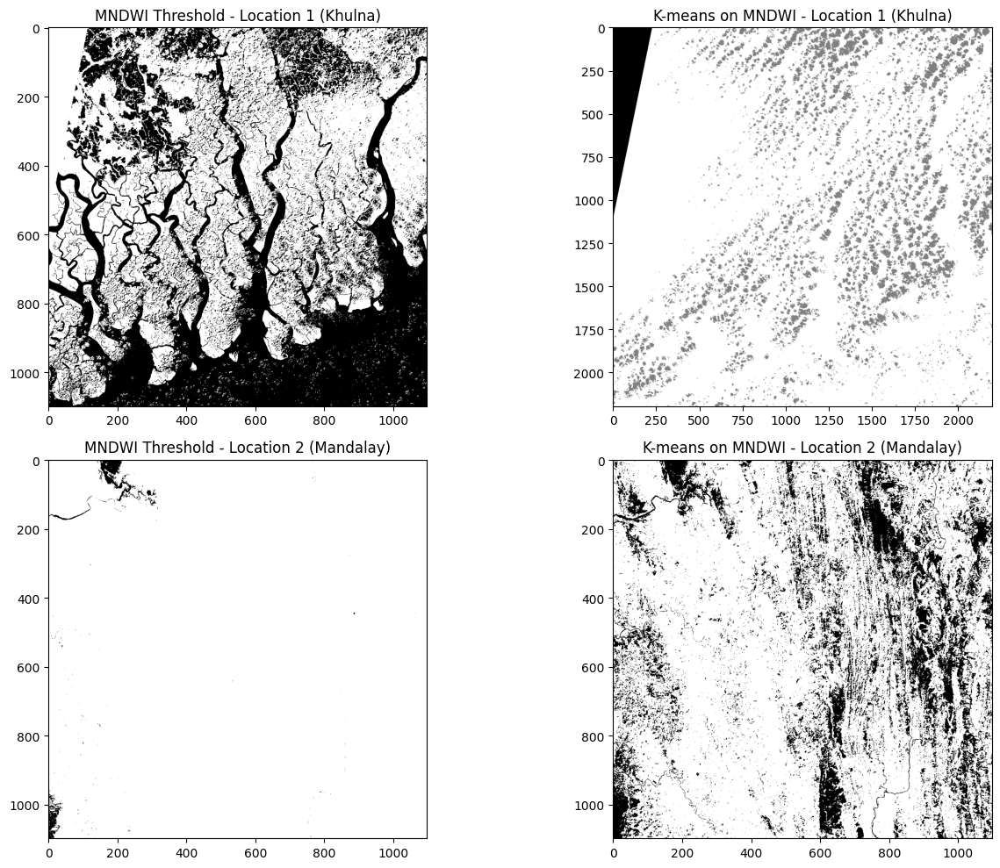

In [53]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].imshow(mndwi_mask1, cmap='binary')
axes[0, 0].set_title('MNDWI Threshold - Location 1 (Khulna)')

axes[0, 1].imshow(kmeans_mask1, cmap='binary')
axes[0, 1].set_title('K-means on MNDWI - Location 1 (Khulna)')

axes[1, 0].imshow(mndwi_mask2, cmap='binary')
axes[1, 0].set_title('MNDWI Threshold - Location 2 (Mandalay)')

axes[1, 1].imshow(kmeans_mask2, cmap='binary')
axes[1, 1].set_title('K-means on MNDWI - Location 2 (Mandalay)')

plt.tight_layout()
plt.show()



In [ ]:
!pip install -q codecarbon


In [51]:
import os
import time
import numpy as np
from codecarbon import EmissionsTracker
import rasterio
from sklearn.cluster import KMeans

# --- Create output dir for logs ---
os.makedirs('codecarbon_logs', exist_ok=True)

# --- Paths to Khulna (Flooded) and Mandalay (Dry) region data ---
green_khulna_path = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B03_20m.jp2'  # Band 03
swir_khulna_path  = '/content/drive/MyDrive/GEOL0069/Final/S2A_MSIL2A_20250402T043221_N0511_R133_T45QYE_20250402T091723.SAFE/GRANULE/L2A_T45QYE_A051067_20250402T044020/IMG_DATA/R20m/T45QYE_20250402T043221_B11_20m.jp2'  # Band 11

green_mandalay_path = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B03_20m.jp2'
swir_mandalay_path  = '/content/drive/MyDrive/GEOL0069/Final/S2C_MSIL2A_20250328T041611_N0511_R090_T46QDK_20250328T084313.SAFE/GRANULE/L2A_T46QDK_A002920_20250328T043216/IMG_DATA/R20m/T46QDK_20250328T041611_B11_20m.jp2'

# --- Helper function: run MNDWI + KMeans on a given region ---
def process_mndwi_kmeans(green_path, swir_path):
    with rasterio.open(green_path) as src:
        green = src.read(1).astype('float32')

    with rasterio.open(swir_path) as src:
        swir = src.read(1).astype('float32')

    # Resize if needed
    if green.shape != swir.shape:
        from skimage.transform import resize
        swir = resize(swir, green.shape, preserve_range=True).astype('float32')

    mndwi = (green - swir) / (green + swir + 1e-10)
    mndwi_mask = (mndwi > 0).astype('uint8')

    # Run K-means clustering
    band_stack = np.dstack([green, swir])
    valid_mask = np.all(band_stack > 0, axis=2)
    X = band_stack[valid_mask].reshape(-1, 2)

    kmeans = KMeans(n_clusters=2, random_state=42)
    labels = kmeans.fit_predict(X)

    kmeans_mask = np.full(band_stack.shape[:2], -1, dtype='uint8')
    kmeans_mask[valid_mask] = labels

    if np.mean(kmeans_mask[mndwi_mask == 1]) < 1:
        kmeans_mask = 1 - kmeans_mask

    return mndwi_mask, kmeans_mask

# --- Run and track for Khulna ---
tracker_khulna = EmissionsTracker(output_dir='codecarbon_logs', project_name='Khulna_Flooded')
tracker_khulna.start()

mndwi_khulna, kmeans_khulna = process_mndwi_kmeans(green_khulna_path, swir_khulna_path)

emission_khulna = tracker_khulna.stop()

# --- Run and track for Mandalay ---
tracker_mandalay = EmissionsTracker(output_dir='codecarbon_logs', project_name='Mandalay_Dry')
tracker_mandalay.start()

mndwi_mandalay, kmeans_mandalay = process_mndwi_kmeans(green_mandalay_path, swir_mandalay_path)

emission_mandalay = tracker_mandalay.stop()

# --- Print Results ---
print(f"🌍 Khulna Emissions:     {emission_khulna:.6f} kg CO₂")
print(f"🌏 Mandalay Emissions:   {emission_mandalay:.6f} kg CO₂")






[codecarbon INFO @ 23:34:37] [setup] RAM Tracking...
[codecarbon INFO @ 23:34:37] [setup] CPU Tracking...
[codecarbon WARNING @ 23:34:37] No CPU tracking mode found. Falling back on CPU constant mode. 
 Linux OS detected: Please ensure RAPL files exist at \sys\class\powercap\intel-rapl to measure CPU

[codecarbon WARNING @ 23:34:39] We saw that you have a Intel(R) Xeon(R) CPU @ 2.20GHz but we don't know it. Please contact us.
[codecarbon INFO @ 23:34:39] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.20GHz
[codecarbon INFO @ 23:34:39] [setup] GPU Tracking...
[codecarbon INFO @ 23:34:39] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 23:34:39] >>> Tracker's metadata:
[codecarbon INFO @ 23:34:39]   Platform system: Linux-6.1.85+-x86_64-with-glibc2.35
[codecarbon INFO @ 23:34:39]   Python version: 3.11.11
[codecarbon INFO @ 23:34:39]   CodeCarbon version: 2.8.3
[codecarbon INFO @ 23:34:39]   Available RAM : 12.675 GB
[codecarbon INFO @ 23:34:39]   CPU count: 2
[codeca

🌍 Khulna Emissions:     0.000055 kg CO₂
🌏 Mandalay Emissions:   0.000060 kg CO₂


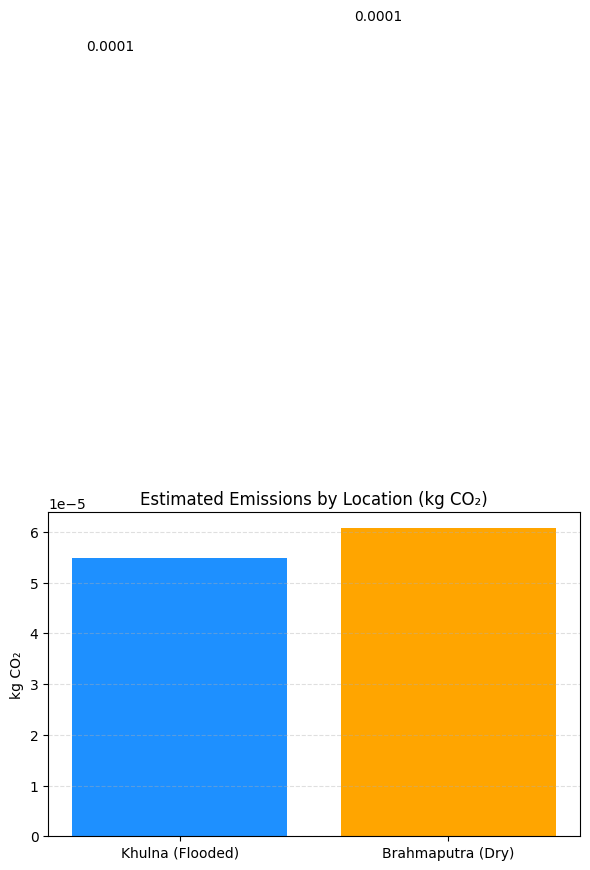

In [52]:
import matplotlib.pyplot as plt

regions = ['Khulna (Flooded)', 'Brahmaputra (Dry)']
emissions = [emission_khulna, emission_brahma]

plt.figure(figsize=(6, 4))
bars = plt.bar(regions, emissions, color=['dodgerblue', 'orange'])
plt.title("Estimated Emissions by Location (kg CO₂)")
plt.ylabel("kg CO₂")
plt.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()

# Add labels
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.05, yval + 0.0001, f"{yval:.4f}", fontsize=10)

plt.show()
